# Voice Noise Analysis 3.1

这一版 notebook 在 `3.0` 的基础上补三件事：

1. 解释 Wiener-style mask 图顶部黄色带的来源。
2. 扩大 low-pass cutoff sweep 范围，用更多测试点展示 tradeoff。
3. 把读入音频和生成音频都保存到本地，方便 PPT 和 demo 直接引用。
4. 重新生成 pipeline 图：中间图不再放 mask heatmap，而是放 low-pass baseline result。

音频来源继续使用队员版本 `Codes/generated_audio/*_2.1.mp3`，不重新合成 clean/noise/noisy。

## 1. 导入库与路径设置

如果 `librosa` 触发 numba cache 报错，这里提前设置了 cache 目录。所有输出会保存到：

- `demo/Voices`
- `demo/Figures`
- `Codes/improved_method_outputs`

In [1]:
from pathlib import Path
import os
import json
import csv

os.environ.setdefault('NUMBA_CACHE_DIR', '/tmp/numba_cache')
os.environ.setdefault('MPLCONFIGDIR', '/tmp/matplotlib')

import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from scipy import signal
from IPython.display import Audio, display

root = Path('/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP')
audio_dir = root / 'Codes' / 'generated_audio'
voice_dir = root / 'demo' / 'Voices'
figure_dir = root / 'demo' / 'Figures'
output_dir = root / 'Codes' / 'improved_method_outputs'

voice_dir.mkdir(parents=True, exist_ok=True)
figure_dir.mkdir(parents=True, exist_ok=True)
output_dir.mkdir(parents=True, exist_ok=True)

FS_TARGET = 16_000
N_PER_SEG = 1024
NO_OVERLAP = 768
DEMO_WINDOW_SEC = 4.0

print('audio_dir =', audio_dir)
print('voice_dir =', voice_dir)
print('figure_dir =', figure_dir)
print('output_dir =', output_dir)

audio_dir = /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/generated_audio
voice_dir = /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices
figure_dir = /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Figures
output_dir = /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/improved_method_outputs


## 2. 读取 2.1 音频，并另存为 3.1 WAV

这里不只是 `display(Audio(...))`，还会把读入后的音频统一保存为 WAV。这样 PPT 插音频时可以直接使用固定文件名。

In [2]:
def read_mono(path, sr=FS_TARGET):
    x, fs = librosa.load(path, sr=sr, mono=True)
    return x.astype(np.float64), fs


def align(*signals):
    n = min(len(x) for x in signals)
    return [x[:n] for x in signals]


def peak_normalize(x, peak=0.92):
    m = np.max(np.abs(x))
    return x.copy() if m == 0 else x * (peak / m)


def save_wav(name, x, fs=FS_TARGET):
    path = voice_dir / name
    sf.write(path, np.asarray(x, dtype=np.float32), fs)
    print('saved:', path)
    return path

clean, fs_clean = read_mono(audio_dir / 'clean_voice_2.1.mp3')
noise, fs_noise = read_mono(audio_dir / 'hiss_noise_2.1.mp3')
noisy, fs_noisy = read_mono(audio_dir / 'noisy_voice_2.1.mp3')
lowpass_from_team, fs_low = read_mono(audio_dir / 'filtered_voice_low_2.1.mp3')

assert len({fs_clean, fs_noise, fs_noisy, fs_low}) == 1
fs = fs_clean
clean, noise, noisy, lowpass_from_team = align(clean, noise, noisy, lowpass_from_team)

input_audio_paths = {
    'clean_3.1': save_wav('clean_voice_3.1.wav', clean, fs),
    'hiss_noise_3.1': save_wav('hiss_noise_3.1.wav', noise, fs),
    'noisy_3.1': save_wav('noisy_voice_3.1.wav', noisy, fs),
    'team_lowpass_3.1': save_wav('lowpass_baseline_from_2.1_3.1.wav', lowpass_from_team, fs),
}

for name, x in [('clean', clean), ('hiss noise', noise), ('noisy', noisy), ('team low-pass', lowpass_from_team)]:
    print(f'{name:14s}: fs={fs}, duration={len(x)/fs:.2f}s, samples={len(x)}')

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/clean_voice_3.1.wav
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/hiss_noise_3.1.wav
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/noisy_voice_3.1.wav
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/lowpass_baseline_from_2.1_3.1.wav
clean         : fs=16000, duration=30.00s, samples=480000
hiss noise    : fs=16000, duration=30.00s, samples=480000
noisy         : fs=16000, duration=30.00s, samples=480000
team low-pass : fs=16000, duration=30.00s, samples=480000


## 3. 试听与基本工具函数

In [3]:
for name, x in [('clean', clean), ('hiss noise', noise), ('noisy', noisy), ('team low-pass', lowpass_from_team)]:
    print(name)
    display(Audio(x, rate=fs))

clean


hiss noise


noisy


team low-pass


In [4]:
def snr_db(reference, estimate):
    reference = np.asarray(reference)
    estimate = np.asarray(estimate)
    return float(10.0 * np.log10(np.sum(reference**2) / (np.sum((estimate - reference)**2) + 1e-12)))


def corr_with_clean(reference, estimate):
    return float(np.corrcoef(reference, estimate)[0, 1])


def high_frequency_ratio(reference_input, estimate, fs, start_hz=5000.0):
    input_fft = np.abs(np.fft.rfft(reference_input))
    estimate_fft = np.abs(np.fft.rfft(estimate))
    freqs = np.fft.rfftfreq(len(reference_input), 1 / fs)
    idx = freqs >= start_hz
    return float(np.mean(estimate_fft[idx]) / (np.mean(input_fft[idx]) + 1e-12))


def speech_band_error_db(reference, estimate, fs, lo=0.0, hi=3500.0):
    freqs = np.fft.rfftfreq(len(reference), 1 / fs)
    ref_fft = np.abs(np.fft.rfft(reference))
    est_fft = np.abs(np.fft.rfft(estimate))
    idx = (freqs >= lo) & (freqs <= hi)
    err = np.sum((est_fft[idx] - ref_fft[idx]) ** 2)
    ref = np.sum(ref_fft[idx] ** 2) + 1e-12
    return float(10.0 * np.log10(err / ref + 1e-12))


def butter_lowpass(x, cutoff_hz, fs, order=6):
    sos = signal.butter(order, cutoff_hz, btype='lowpass', fs=fs, output='sos')
    return signal.sosfiltfilt(sos, x)


def spectrogram_db(x, fs):
    freqs, times, spec = signal.spectrogram(
        x,
        fs=fs,
        window='hann',
        nperseg=N_PER_SEG,
        noverlap=NO_OVERLAP,
        scaling='spectrum',
        mode='magnitude',
    )
    return freqs, times, 20 * np.log10(spec + 1e-8)


def plot_spectrogram(ax, x, fs, title, vmin=-145, vmax=-20):
    freqs, times, spec_db = spectrogram_db(x, fs)
    img = ax.pcolormesh(times, freqs, spec_db, shading='gouraud', cmap='magma', vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_ylim(0, fs / 2)
    return img


def print_metrics(label, x):
    print(f'{label:24s} | SNR={snr_db(clean, x):6.2f} dB | corr={corr_with_clean(clean, x):.4f} | HF ratio={high_frequency_ratio(noisy, x, fs):.4f}')

print_metrics('noisy input', noisy)
print_metrics('team low-pass', lowpass_from_team)

noisy input              | SNR= 17.49 dB | corr=0.9912 | HF ratio=1.0000
team low-pass            | SNR= 23.97 dB | corr=0.9980 | HF ratio=0.0032


## 4. Low-pass cutoff sweep：把 tradeoff 做出来

旧图的问题是 cutoff 范围太窄，只看到了几个相近的点。这里扩大到 `500 Hz - 7500 Hz`，这样能同时看到三种情况：

- cutoff 太低：噪声压得很狠，但语音也被削掉，声音会闷甚至失真。
- cutoff 合理：高频 hiss 明显减少，同时语音主体还能保留。
- cutoff 太高：语音细节保留更多，但 hiss 也跟着留下来，逐渐接近 noisy input。

这就是我们要讲的 tradeoff。

In [5]:
cutoffs = np.arange(500, 7501, 250)
order = 6
sweep = []
filtered_by_cutoff = {}

for cutoff in cutoffs:
    y = butter_lowpass(noisy, float(cutoff), fs, order=order)
    y = y[:len(clean)]
    filtered_by_cutoff[int(cutoff)] = y
    sweep.append({
        'cutoff_hz': int(cutoff),
        'snr_vs_clean_db': snr_db(clean, y),
        'snr_improvement_db': snr_db(clean, y) - snr_db(clean, noisy),
        'corr_with_clean': corr_with_clean(clean, y),
        'high_freq_ratio_vs_noisy': high_frequency_ratio(noisy, y, fs, start_hz=5000.0),
        'speech_band_error_db': speech_band_error_db(clean, y, fs, lo=0, hi=3500),
    })

best = max(sweep, key=lambda row: row['snr_vs_clean_db'])
print('Best SNR cutoff:', best)

# Save sweep table.
json_path = output_dir / 'lowpass_tradeoff_sweep_3.1.json'
csv_path = output_dir / 'lowpass_tradeoff_sweep_3.1.csv'
with open(json_path, 'w', encoding='utf-8') as f:
    json.dump(sweep, f, indent=2, ensure_ascii=False)
with open(csv_path, 'w', newline='', encoding='utf-8') as f:
    writer = csv.DictWriter(f, fieldnames=list(sweep[0].keys()))
    writer.writeheader()
    writer.writerows(sweep)
print('saved:', json_path)
print('saved:', csv_path)

Best SNR cutoff: {'cutoff_hz': 3000, 'snr_vs_clean_db': 24.135201610658253, 'snr_improvement_db': 6.640423893675841, 'corr_with_clean': 0.9980701518596453, 'high_freq_ratio_vs_noisy': 0.00409880328320974, 'speech_band_error_db': -29.21659313909331}
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/improved_method_outputs/lowpass_tradeoff_sweep_3.1.json
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/improved_method_outputs/lowpass_tradeoff_sweep_3.1.csv


Best cutoff by SNR: 3000 Hz
Reasonable tradeoff zone: 2500 - 4000 Hz


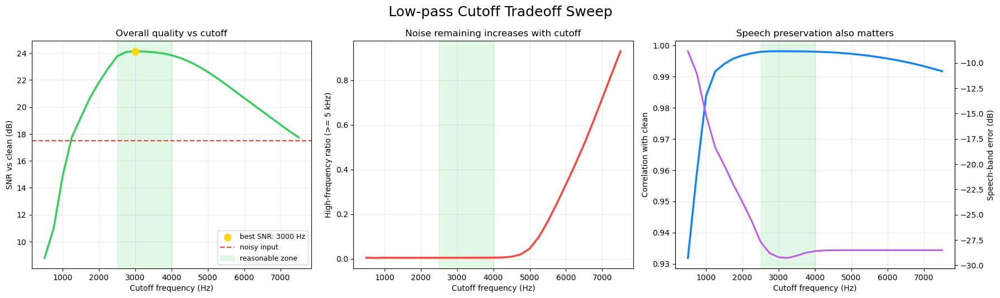

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Figures/lowpass_tradeoff_sweep_3.1.png


In [6]:
cutoff_arr = np.array([row['cutoff_hz'] for row in sweep])
snr_arr = np.array([row['snr_vs_clean_db'] for row in sweep])
snr_imp_arr = np.array([row['snr_improvement_db'] for row in sweep])
hf_arr = np.array([row['high_freq_ratio_vs_noisy'] for row in sweep])
corr_arr = np.array([row['corr_with_clean'] for row in sweep])
speech_err_arr = np.array([row['speech_band_error_db'] for row in sweep])

best_cutoff = int(cutoff_arr[np.argmax(snr_arr)])
reasonable = cutoff_arr[(snr_arr >= snr_arr.max() - 0.5) & (hf_arr <= 0.08)]
print('Best cutoff by SNR:', best_cutoff, 'Hz')
if len(reasonable):
    print('Reasonable tradeoff zone:', int(reasonable.min()), '-', int(reasonable.max()), 'Hz')
else:
    print('Reasonable tradeoff zone: None')

fig, axes = plt.subplots(1, 3, figsize=(18, 5.4))

axes[0].plot(cutoff_arr, snr_arr, color='#30D158', linewidth=2.5)
axes[0].scatter([best_cutoff], [snr_arr.max()], color='#FFD60A', s=80, zorder=5, label=f'best SNR: {best_cutoff} Hz')
axes[0].axhline(snr_db(clean, noisy), color='#FF453A', linestyle='--', linewidth=1.6, label='noisy input')
if len(reasonable):
    axes[0].axvspan(reasonable.min(), reasonable.max(), color='#30D158', alpha=0.14, label='reasonable zone')
axes[0].set_title('Overall quality vs cutoff')
axes[0].set_xlabel('Cutoff frequency (Hz)')
axes[0].set_ylabel('SNR vs clean (dB)')
axes[0].grid(alpha=0.25)
axes[0].legend(fontsize=9)

axes[1].plot(cutoff_arr, hf_arr, color='#FF453A', linewidth=2.5)
if len(reasonable):
    axes[1].axvspan(reasonable.min(), reasonable.max(), color='#30D158', alpha=0.14)
axes[1].set_title('Noise remaining increases with cutoff')
axes[1].set_xlabel('Cutoff frequency (Hz)')
axes[1].set_ylabel('High-frequency ratio (>= 5 kHz)')
axes[1].grid(alpha=0.25)

axes[2].plot(cutoff_arr, corr_arr, color='#0A84FF', linewidth=2.5, label='correlation')
ax2 = axes[2].twinx()
ax2.plot(cutoff_arr, speech_err_arr, color='#BF5AF2', linewidth=2.2, label='speech-band error')
if len(reasonable):
    axes[2].axvspan(reasonable.min(), reasonable.max(), color='#30D158', alpha=0.14)
axes[2].set_title('Speech preservation also matters')
axes[2].set_xlabel('Cutoff frequency (Hz)')
axes[2].set_ylabel('Correlation with clean')
ax2.set_ylabel('Speech-band error (dB)')
axes[2].grid(alpha=0.25)

fig.suptitle('Low-pass Cutoff Tradeoff Sweep', fontsize=18)
fig.tight_layout()
tradeoff_fig = figure_dir / 'lowpass_tradeoff_sweep_3.1.png'
fig.savefig(tradeoff_fig, dpi=180, bbox_inches='tight')
plt.show()
print('saved:', tradeoff_fig)

### 这张 tradeoff 图应该怎么讲

可以这样说：

> Low-pass filtering is not simply “the lower the cutoff, the better.” A very low cutoff removes high-frequency noise, but it also removes useful speech components and makes the voice muffled. A very high cutoff preserves more detail, but it lets hiss remain. Therefore, the cutoff has to be chosen as a balance between noise suppression and speech preservation.

从这组结果看，合理区间通常会落在中间区域，而不是两端。两端分别代表：

- too aggressive filtering
- too weak filtering

## 5. 保存代表性 cutoff 音频

为了 demo 和试听，保存几个代表性版本：

- `750 Hz`：过度滤波，语音明显变闷。
- `1500 Hz`：仍然偏 aggressive。
- `best_cutoff`：当前指标下的最佳点。
- `4000 Hz`：接近队员版本 baseline 的主展示结果。
- `7000 Hz`：滤波太弱，hiss 残留明显。

In [7]:
representative_cutoffs = sorted(set([750, 1500, best_cutoff, 4000, 7000]))
representative_paths = {}
for cutoff in representative_cutoffs:
    y = filtered_by_cutoff[int(cutoff)]
    representative_paths[f'lowpass_{cutoff}Hz'] = save_wav(f'lowpass_cutoff_{cutoff:04d}_3.1.wav', y, fs)
    print_metrics(f'low-pass {cutoff} Hz', y)

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/lowpass_cutoff_0750_3.1.wav
low-pass 750 Hz          | SNR= 11.00 dB | corr=0.9595 | HF ratio=0.0033
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/lowpass_cutoff_1500_3.1.wav
low-pass 1500 Hz         | SNR= 19.24 dB | corr=0.9940 | HF ratio=0.0037
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/lowpass_cutoff_3000_3.1.wav
low-pass 3000 Hz         | SNR= 24.14 dB | corr=0.9981 | HF ratio=0.0041
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/lowpass_cutoff_4000_3.1.wav
low-pass 4000 Hz         | SNR= 23.84 dB | corr=0.9979 | HF ratio=0.0048
saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/lowpass_cutoff_7000_3.1.wav
low-pass 7000 Hz         | SNR= 18.68 dB | corr=0.9933 | HF ratio=0.7185


In [8]:
# Listen to representative versions.
for label, path in representative_paths.items():
    x, _ = read_mono(path)
    print(label, path.name)
    display(Audio(x, rate=fs))

lowpass_750Hz lowpass_cutoff_0750_3.1.wav


lowpass_1500Hz lowpass_cutoff_1500_3.1.wav


lowpass_3000Hz lowpass_cutoff_3000_3.1.wav


lowpass_4000Hz lowpass_cutoff_4000_3.1.wav


lowpass_7000Hz lowpass_cutoff_7000_3.1.wav


## 6. 代表性 spectrogram：差、合适、太弱

这张图比单独一条曲线更适合放 PPT：它直接展示三种 cutoff 的视觉差别。

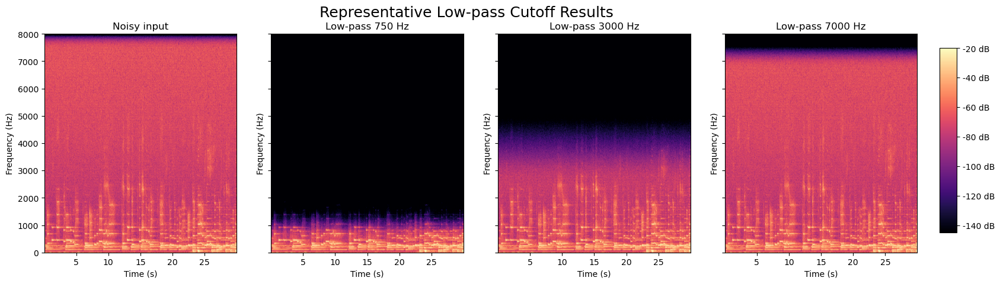

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Figures/lowpass_representative_spectrograms_3.1.png


In [9]:
show_cutoffs = [750, best_cutoff, 7000]
fig, axes = plt.subplots(1, 4, figsize=(19, 4.8), sharey=True)
img = plot_spectrogram(axes[0], noisy, fs, 'Noisy input')
for ax, cutoff in zip(axes[1:], show_cutoffs):
    plot_spectrogram(ax, filtered_by_cutoff[int(cutoff)], fs, f'Low-pass {cutoff} Hz')
fig.subplots_adjust(right=0.90, wspace=0.18)
cax = fig.add_axes([0.92, 0.18, 0.015, 0.65])
fig.colorbar(img, cax=cax, format='%+2.0f dB')
fig.suptitle('Representative Low-pass Cutoff Results', fontsize=18)
rep_fig = figure_dir / 'lowpass_representative_spectrograms_3.1.png'
fig.savefig(rep_fig, dpi=180, bbox_inches='tight')
plt.show()
print('saved:', rep_fig)

## 7. Mask 图顶部黄色带为什么会出现？

`3.0` 版本的 mask 图最上方出现一条黄色带，主要原因不是那里有“很重要的语音”，而是 **mask 估计在频谱边界处产生的可视化/估计伪影**。

更具体地说：

- STFT 的最高频率接近 Nyquist frequency，也就是采样率的一半。
- MP3 编码、重采样、窗函数边界和噪声功率估计都可能让最顶端频率 bin 的能量估计不稳定。
- Wiener-style mask 的公式是根据 speech/noise power ratio 算 gain。如果某些边界 bin 的 noise estimate 偏小，mask 就可能接近 1，于是显示成黄色。

所以这条黄带不应该被解释为“高频语音被保留得很好”。更合适的处理方式是：

- presentation 中不要重点分析最顶端边界频率；
- 或者加一个 very-high-frequency guard，把接近 Nyquist 的区域压低；
- 或者把 mask 图显示范围限制在更有意义的语音分析区间。

下面的实现会加入一个 `TOP_GUARD_HZ`，避免这个边界伪影干扰讲解。

## 8. Wiener-style frequency mask，加入顶部 guard

In [10]:
MASK_FLOOR = 0.12
NOISE_OVER_ESTIMATE = 0.4
MASK_SMOOTHING_BINS = 1
TOP_GUARD_HZ = 7200
TOP_GUARD_GAIN = 0.12


def rms_match(reference, estimate):
    ref_rms = np.sqrt(np.mean(reference**2) + 1e-12)
    est_rms = np.sqrt(np.mean(estimate**2) + 1e-12)
    return estimate * (ref_rms / est_rms)


def moving_average_frequency(mask, bins):
    if bins <= 1:
        return mask
    kernel = np.ones(bins) / bins
    smoothed = np.empty_like(mask)
    for frame in range(mask.shape[1]):
        smoothed[:, frame] = np.convolve(mask[:, frame], kernel, mode='same')
    return smoothed

freqs, times, noisy_stft = signal.stft(
    noisy,
    fs=fs,
    window='hann',
    nperseg=N_PER_SEG,
    noverlap=NO_OVERLAP,
    boundary='zeros',
    padded=True,
)
_, _, noise_stft = signal.stft(
    noise,
    fs=fs,
    window='hann',
    nperseg=N_PER_SEG,
    noverlap=NO_OVERLAP,
    boundary='zeros',
    padded=True,
)

noisy_power = np.abs(noisy_stft) ** 2
noise_power = np.mean(np.abs(noise_stft) ** 2, axis=1, keepdims=True)
estimated_speech_power = np.maximum(noisy_power - NOISE_OVER_ESTIMATE * noise_power, 0.0)

raw_mask = estimated_speech_power / (estimated_speech_power + noise_power + 1e-12)
raw_mask = moving_average_frequency(raw_mask, MASK_SMOOTHING_BINS)
raw_mask = np.clip(raw_mask, MASK_FLOOR, 1.0)

mask = raw_mask.copy()
top_idx = freqs >= TOP_GUARD_HZ
mask[top_idx, :] = np.minimum(mask[top_idx, :], TOP_GUARD_GAIN)

enhanced_stft = mask * noisy_stft
_, wiener_masked = signal.istft(
    enhanced_stft,
    fs=fs,
    window='hann',
    nperseg=N_PER_SEG,
    noverlap=NO_OVERLAP,
    input_onesided=True,
    boundary=True,
)
wiener_masked = wiener_masked[:len(noisy)]
wiener_masked = rms_match(noisy, wiener_masked)
wiener_masked = peak_normalize(wiener_masked)

wiener_path = save_wav('wiener_masked_voice_3.1.wav', wiener_masked, fs)
print_metrics('Wiener-style mask', wiener_masked)

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/wiener_masked_voice_3.1.wav
Wiener-style mask        | SNR= 23.74 dB | corr=0.9979 | HF ratio=0.1202


## 9. Mask 图：raw vs guarded

左边是原始 mask，右边是加了顶部 guard 后的 mask。这个对比可以帮助说明：最顶部的黄带是边界估计问题，不是我们要重点讲的语音信息。

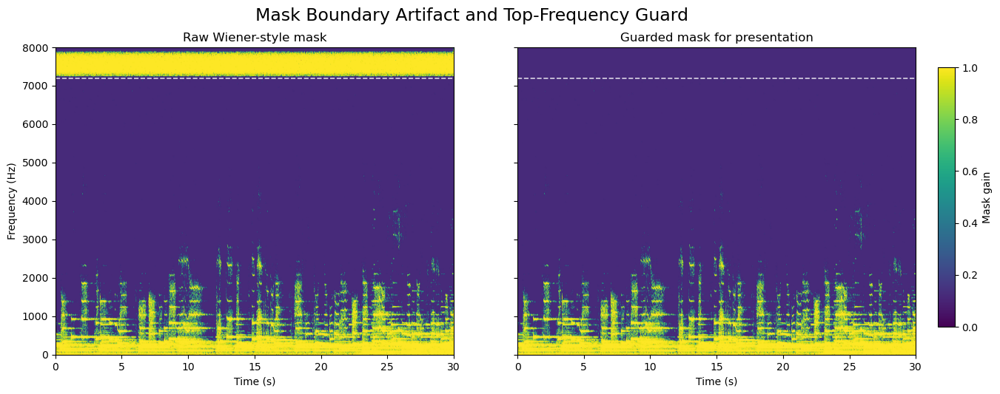

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Figures/wiener_mask_raw_vs_guarded_3.1.png


In [11]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5.4), sharey=True)
for ax, m, title in [
    (axes[0], raw_mask, 'Raw Wiener-style mask'),
    (axes[1], mask, 'Guarded mask for presentation'),
]:
    img = ax.pcolormesh(times, freqs, m, shading='gouraud', cmap='viridis', vmin=0, vmax=1)
    ax.axhline(TOP_GUARD_HZ, color='white', linestyle='--', linewidth=1.2, alpha=0.8)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylim(0, fs / 2)
axes[0].set_ylabel('Frequency (Hz)')
fig.subplots_adjust(right=0.90, wspace=0.16)
cax = fig.add_axes([0.92, 0.18, 0.015, 0.65])
fig.colorbar(img, cax=cax, label='Mask gain')
fig.suptitle('Mask Boundary Artifact and Top-Frequency Guard', fontsize=17)
mask_fig = figure_dir / 'wiener_mask_raw_vs_guarded_3.1.png'
fig.savefig(mask_fig, dpi=180, bbox_inches='tight')
plt.show()
print('saved:', mask_fig)

## 10. Pipeline 图：中间换成 baseline result

按照你的要求，这一版 pipeline 不再用中间图展示 mask heatmap，而是改成：

`Noisy spectrogram -> Low-pass baseline spectrogram -> Wiener-style mask result spectrogram`

这样更像 presentation 里的方法对比图，而不是单纯的 mask 可视化图。

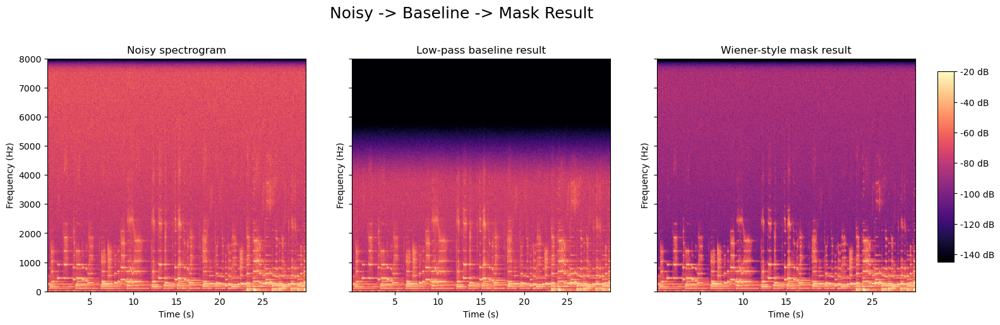

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Figures/mask_pipeline_baseline_middle_3.1.png


In [12]:
baseline_for_pipeline = filtered_by_cutoff.get(4000, lowpass_from_team)

fig, axes = plt.subplots(1, 3, figsize=(17.5, 5.2), sharey=True)
img0 = plot_spectrogram(axes[0], noisy, fs, 'Noisy spectrogram')
plot_spectrogram(axes[1], baseline_for_pipeline, fs, 'Low-pass baseline result')
plot_spectrogram(axes[2], wiener_masked, fs, 'Wiener-style mask result')
fig.subplots_adjust(right=0.91, wspace=0.18, top=0.82)
cax = fig.add_axes([0.93, 0.20, 0.015, 0.58])
fig.colorbar(img0, cax=cax, format='%+2.0f dB')
fig.suptitle('Noisy -> Baseline -> Mask Result', fontsize=18)
pipeline_fig = figure_dir / 'mask_pipeline_baseline_middle_3.1.png'
fig.savefig(pipeline_fig, dpi=180, bbox_inches='tight')
plt.show()
print('saved:', pipeline_fig)

## 11. 保存 3.1 实验输出索引

In [13]:
metrics = {
    'source_audio': {
        'clean': str(audio_dir / 'clean_voice_2.1.mp3'),
        'noise': str(audio_dir / 'hiss_noise_2.1.mp3'),
        'noisy': str(audio_dir / 'noisy_voice_2.1.mp3'),
        'team_lowpass': str(audio_dir / 'filtered_voice_low_2.1.mp3'),
    },
    'saved_audio': {k: str(v) for k, v in input_audio_paths.items()} | {k: str(v) for k, v in representative_paths.items()} | {'wiener_masked': str(wiener_path)},
    'lowpass_sweep': {
        'cutoff_min_hz': int(cutoffs.min()),
        'cutoff_max_hz': int(cutoffs.max()),
        'step_hz': int(cutoffs[1] - cutoffs[0]),
        'filter_order': order,
        'best_snr_cutoff_hz': int(best_cutoff),
        'best_snr_db': float(np.max(snr_arr)),
        'reasonable_zone_hz': [int(reasonable.min()), int(reasonable.max())] if len(reasonable) else None,
    },
    'wiener_style_mask': {
        'mask_floor': MASK_FLOOR,
        'noise_over_estimate': NOISE_OVER_ESTIMATE,
        'top_guard_hz': TOP_GUARD_HZ,
        'top_guard_gain': TOP_GUARD_GAIN,
        'snr_vs_clean_db': snr_db(clean, wiener_masked),
    },
    'figures': {
        'tradeoff_sweep': str(tradeoff_fig),
        'representative_spectrograms': str(rep_fig),
        'mask_raw_vs_guarded': str(mask_fig),
        'pipeline_baseline_middle': str(pipeline_fig),
    },
}

metrics_path = output_dir / 'notebook_metrics_3.1.json'
with open(metrics_path, 'w', encoding='utf-8') as f:
    json.dump(metrics, f, indent=2, ensure_ascii=False)

np.savez_compressed(
    output_dir / 'wiener_mask_data_notebook_3.1.npz',
    freqs=freqs,
    times=times,
    raw_mask=raw_mask,
    guarded_mask=mask,
    enhanced=wiener_masked,
    fs=np.array([fs]),
)

print('saved:', metrics_path)
print(json.dumps(metrics, indent=2, ensure_ascii=False))

saved: /Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/improved_method_outputs/notebook_metrics_3.1.json
{
  "source_audio": {
    "clean": "/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/generated_audio/clean_voice_2.1.mp3",
    "noise": "/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/generated_audio/hiss_noise_2.1.mp3",
    "noisy": "/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/generated_audio/noisy_voice_2.1.mp3",
    "team_lowpass": "/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/Codes/generated_audio/filtered_voice_low_2.1.mp3"
  },
  "saved_audio": {
    "clean_3.1": "/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/clean_voice_3.1.wav",
    "hiss_noise_3.1": "/Users/xiejz959/Xiejz/College/Signal System & Probability/project/SSP_CP/demo/Voices/hiss_noise_3.1.wav",
    "noisy_3.1": "/Users/xie

## 12. 讲法总结

Low-pass 的 tradeoff 可以这样讲：

- Cutoff 太低：高频 hiss 确实被压掉，但语音信息也被压掉，声音变闷。
- Cutoff 太高：语音细节保留更多，但高频 hiss 也保留下来。
- 所以 cutoff 不是显然的固定答案，而是根据 noise suppression 和 speech preservation 做折中。

Mask 图顶部黄带可以这样讲：

- 它是接近 Nyquist 的边界区域，容易受到 MP3、重采样、STFT 边界和噪声估计误差影响。
- 它不是我们要重点解释的语音成分。
- 在展示时应关注主要语音频段和高频 hiss 背景，而不是最顶端的一条边界线。